NPZ 파일 로드 중: /data/ephemeral/home/measure_volume_by_multiview/project/output/exports/mini_npz/results.npz
NPZ 파일 키: ['depth', 'conf', 'extrinsics', 'intrinsics']
Depth shape: (54, 420, 756)
Depth range: 0.296 ~ 1.670 meters
Camera intrinsics: fx=548.8, fy=542.8, cx=382.7, cy=208.1
Depth visualization 이미지 로드 완료
trimesh PointCloud created with 317520 points


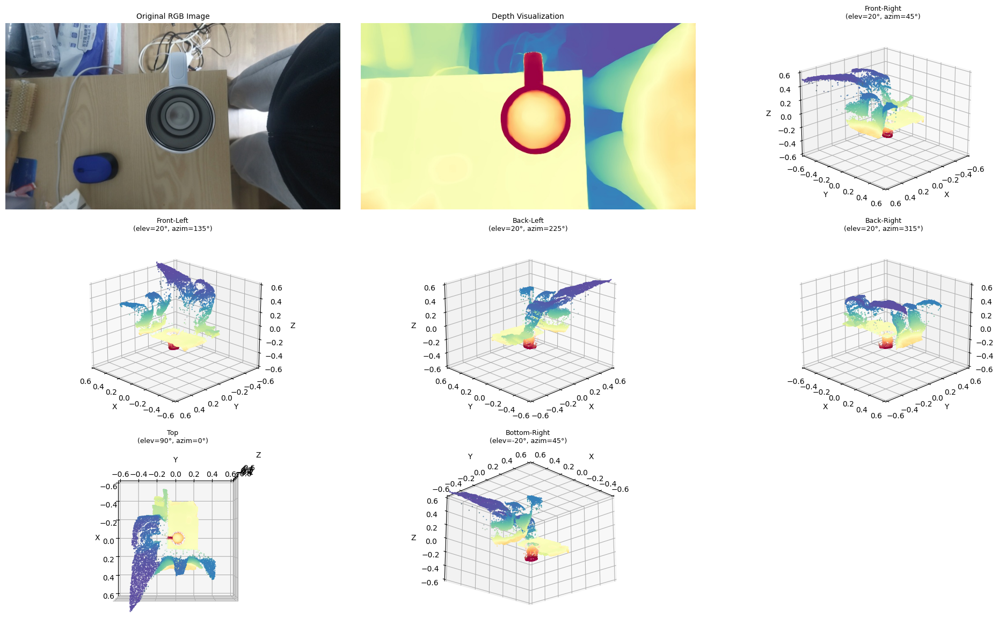


Point cloud saved to: /data/ephemeral/home/measure_volume_by_multiview/project/output/depth_pointcloud.glb
GLB 파일을 외부 뷰어에서 열어서 인터랙티브하게 볼 수 있습니다.

인터랙티브 3D 시각화 생성 중...


인터랙티브 3D 시각화 완료! 마우스로 회전하고 확대/축소할 수 있습니다.


In [14]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os
import trimesh
from mpl_toolkits.mplot3d import Axes3D

# plotly를 사용한 인터랙티브 3D 시각화 (선택적)
try:
    import plotly.graph_objects as go
    import plotly.express as px
    PLOTLY_AVAILABLE = True
except ImportError:
    PLOTLY_AVAILABLE = False
    print("plotly가 설치되어 있지 않습니다. 인터랙티브 3D 시각화를 사용하려면 'pip install plotly'를 실행하세요.")

# NPZ 파일 경로 (원본 depth 값)
npz_path = "/data/ephemeral/home/measure_volume_by_multiview/project/output/exports/mini_npz/results.npz"

# Depth visualization 이미지 경로 (시각화용)
depth_vis_dir = "/data/ephemeral/home/measure_volume_by_multiview/project/output/depth_vis"
first_depth_vis_file = os.path.join(depth_vis_dir, "0000.jpg")

if os.path.exists(npz_path):
    # NPZ 파일에서 원본 depth 값 로드
    print(f"NPZ 파일 로드 중: {npz_path}")
    data = np.load(npz_path)
    
    # 포함된 키 확인
    print(f"NPZ 파일 키: {list(data.keys())}")
    
    # 원본 depth 값 (실제 거리, 미터 단위)
    depth = data['depth']  # (N, H, W)
    print(f"Depth shape: {depth.shape}")
    print(f"Depth range: {depth.min():.3f} ~ {depth.max():.3f} meters")
    
    # 첫 번째 프레임 사용
    frame_idx = 0
    depth_frame = depth[frame_idx]  # (H, W)
    H_d, W_d = depth_frame.shape
    
    # Intrinsics 로드 (있으면)
    if 'intrinsics' in data:
        intrinsics = data['intrinsics']  # (N, 3, 3)
        K = intrinsics[frame_idx]  # (3, 3)
        fx, fy = K[0, 0], K[1, 1]
        cx, cy = K[0, 2], K[1, 2]
        print(f"Camera intrinsics: fx={fx:.1f}, fy={fy:.1f}, cx={cx:.1f}, cy={cy:.1f}")
    else:
        # Intrinsics가 없으면 추정 (fallback)
        fx = fy = W_d * 0.8
        cx = W_d / 2.0
        cy = H_d / 2.0
        print(f"Intrinsics 없음, 추정값 사용: fx={fx:.1f}, fy={fy:.1f}, cx={cx:.1f}, cy={cy:.1f}")
    
    # Depth visualization 이미지 로드 (시각화용)
    rgb_image = None
    depth_vis = None
    if os.path.exists(first_depth_vis_file):
        img = Image.open(first_depth_vis_file)
        img_array = np.array(img)
        H_img, W_img = img_array.shape[:2]
        mid = W_img // 2
        rgb_image = img_array[:, :mid, :]  # 왼쪽 절반
        depth_vis = img_array[:, mid:, :]  # 오른쪽 절반
        print(f"Depth visualization 이미지 로드 완료")
    
    # 다운샘플링 (너무 많은 점은 렌더링이 느림)
    downsample = 1  # 2픽셀마다 하나씩
    depth_downsampled = depth_frame[::downsample, ::downsample]
    H_ds, W_ds = depth_downsampled.shape
    
    # 픽셀 좌표 생성 (다운샘플링된 크기에 맞춤)
    u_coords, v_coords = np.meshgrid(
        np.arange(W_ds) * downsample,  # 원본 이미지 좌표
        np.arange(H_ds) * downsample,
        indexing='xy'
    )
    
    # 픽셀 좌표를 3D 카메라 좌표로 변환
    # X = (u - cx) * depth / fx
    # Y = (v - cy) * depth / fy
    # Z = depth
    x_3d = (u_coords - cx) * depth_downsampled / fx
    y_3d = (v_coords - cy) * depth_downsampled / fy
    z_3d = depth_downsampled
    
    # Point cloud 색상 (depth visualization에서 가져오거나 depth 값으로 색상화)
    if depth_vis is not None:
        # depth_vis의 크기를 depth_downsampled에 맞춤
        H_vis, W_vis = depth_vis.shape[:2]
        H_ds, W_ds = depth_downsampled.shape
        
        # 크기가 다르면 리사이즈
        if H_vis != H_ds or W_vis != W_ds:
            print(f"Depth vis 크기 조정: ({H_vis}, {W_vis}) -> ({H_ds}, {W_ds})")
            depth_vis_resized = np.array(Image.fromarray(depth_vis).resize((W_ds, H_ds), Image.LANCZOS))
            colors = depth_vis_resized / 255.0
        else:
            colors = depth_vis / 255.0
    else:
        # Depth visualization이 없으면 depth 값으로 색상화
        depth_normalized = (depth_downsampled - depth_downsampled.min()) / (depth_downsampled.max() - depth_downsampled.min() + 1e-6)
        colors = plt.cm.viridis(depth_normalized)[:, :, :3]
    
    # 모든 점을 사용
    x_all = x_3d.flatten()
    y_all = y_3d.flatten()
    z_all = z_3d.flatten()
    c_all = colors.reshape(-1, 3)
    
    # 크기 확인 및 일치시키기
    n_points = len(x_all)
    n_colors = len(c_all)
    if n_points != n_colors:
        print(f"Warning: Points ({n_points}) and colors ({n_colors}) size mismatch! Trimming to match.")
        min_size = min(n_points, n_colors)
        x_all = x_all[:min_size]
        y_all = y_all[:min_size]
        z_all = z_all[:min_size]
        c_all = c_all[:min_size]
    
    # trimesh PointCloud 생성
    points = np.column_stack([x_all, y_all, z_all])
    points_centered = points - points.mean(axis=0)
    
    # 색상을 0-255 범위로 변환
    colors_uint8 = (c_all * 255).astype(np.uint8)
    
    # 최종 크기 확인
    assert len(points_centered) == len(colors_uint8), f"Final size mismatch: points={len(points_centered)}, colors={len(colors_uint8)}"
    
    # trimesh PointCloud 생성
    point_cloud = trimesh.PointCloud(
        vertices=points_centered,
        colors=colors_uint8
    )
    
    print(f"trimesh PointCloud created with {len(points_centered)} points")
    
    # 여러 각도에서 렌더링
    angles = [
        (20, 45, "Front-Right"),
        (20, 135, "Front-Left"),
        (20, 225, "Back-Left"),
        (20, 315, "Back-Right"),
        (90, 0, "Top"),
        (-20, 45, "Bottom-Right"),
    ]
    
    # 원본 이미지와 depth visualization 표시
    fig = plt.figure(figsize=(20, 12))
    
    # 원본 이미지
    if rgb_image is not None:
        ax1 = plt.subplot(3, 3, 1)
        ax1.imshow(rgb_image)
        ax1.set_title('Original RGB Image', fontsize=10)
        ax1.axis('off')
    
    # Depth visualization
    if depth_vis is not None:
        ax2 = plt.subplot(3, 3, 2)
        ax2.imshow(depth_vis)
        ax2.set_title('Depth Visualization', fontsize=10)
        ax2.axis('off')
    else:
        # Depth map 직접 표시
        ax2 = plt.subplot(3, 3, 2)
        im = ax2.imshow(depth_frame, cmap='viridis')
        ax2.set_title('Depth Map (meters)', fontsize=10)
        plt.colorbar(im, ax=ax2)
    
    # 여러 각도에서 렌더링
    start_idx = 3 if (rgb_image is not None or depth_vis is not None) else 1
    for idx, (elev, azim, title) in enumerate(angles):
        ax = plt.subplot(3, 3, start_idx + idx, projection='3d')
        
        # 샘플링 (너무 많은 점은 렌더링이 느림)
        max_points = 30000
        n_points = len(points_centered)
        n_colors = len(colors_uint8)
        
        # 크기 재확인 (안전장치)
        if n_points != n_colors:
            print(f"Warning in plot {idx}: Points ({n_points}) and colors ({n_colors}) size mismatch!")
            min_size = min(n_points, n_colors)
            points_centered = points_centered[:min_size]
            colors_uint8 = colors_uint8[:min_size]
            n_points = min_size
        
        if n_points > max_points:
            indices = np.random.choice(n_points, max_points, replace=False)
            points_plot = points_centered[indices]
            colors_plot = colors_uint8[indices]
        else:
            points_plot = points_centered
            colors_plot = colors_uint8
        
        # 색상을 0-1 범위로 변환
        colors_normalized = colors_plot / 255.0
        
        ax.scatter(
            points_plot[:, 0],
            points_plot[:, 1],
            points_plot[:, 2],
            c=colors_normalized,
            s=0.5,
            alpha=0.8
        )
        
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.set_title(f'{title}\n(elev={elev}°, azim={azim}°)', fontsize=9)
        ax.view_init(elev=elev, azim=azim)
        
        # 축 비율 맞추기
        max_range = np.array([
            points_centered[:, 0].max() - points_centered[:, 0].min(),
            points_centered[:, 1].max() - points_centered[:, 1].min(),
            points_centered[:, 2].max() - points_centered[:, 2].min()
        ]).max() / 2.0
        
        mid_x = points_centered[:, 0].mean()
        mid_y = points_centered[:, 1].mean()
        mid_z = points_centered[:, 2].mean()
        
        ax.set_xlim(mid_x - max_range, mid_x + max_range)
        ax.set_ylim(mid_y - max_range, mid_y + max_range)
        ax.set_zlim(mid_z - max_range, mid_z + max_range)
    
    plt.tight_layout()
    plt.show()
    
    # GLB 파일로 저장
    output_dir = "/data/ephemeral/home/measure_volume_by_multiview/project/output"
    os.makedirs(output_dir, exist_ok=True)
    glb_path = os.path.join(output_dir, "depth_pointcloud.glb")
    point_cloud.export(glb_path)
    print(f"\nPoint cloud saved to: {glb_path}")
    print("GLB 파일을 외부 뷰어에서 열어서 인터랙티브하게 볼 수 있습니다.")
    
    # plotly를 사용한 인터랙티브 3D 시각화 (선택적)
    if PLOTLY_AVAILABLE:
        print("\n인터랙티브 3D 시각화 생성 중...")
        
        # 샘플링 (plotly는 많은 점을 처리하기 어려움)
        max_plotly_points = 20000
        if len(points_centered) > max_plotly_points:
            indices = np.random.choice(len(points_centered), max_plotly_points, replace=False)
            points_plotly = points_centered[indices]
            colors_plotly = colors_uint8[indices]
        else:
            points_plotly = points_centered
            colors_plotly = colors_uint8
        
        # RGB 색상을 hex 문자열로 변환
        colors_hex = [f'#{r:02x}{g:02x}{b:02x}' for r, g, b in colors_plotly]
        
        # plotly 3D scatter plot
        fig_plotly = go.Figure(data=go.Scatter3d(
            x=points_plotly[:, 0],
            y=points_plotly[:, 1],
            z=points_plotly[:, 2],
            mode='markers',
            marker=dict(
                size=2,
                color=colors_hex,
                opacity=0.8,
            ),
            text=[f'Point {i}' for i in range(len(points_plotly))],
        ))
        
        fig_plotly.update_layout(
            title='Interactive 3D Point Cloud (마우스로 회전/확대/축소 가능)',
            scene=dict(
                xaxis_title='X',
                yaxis_title='Y',
                zaxis_title='Z',
                aspectmode='data',
            ),
            width=1000,
            height=800,
        )
        
        fig_plotly.show()
        print("인터랙티브 3D 시각화 완료! 마우스로 회전하고 확대/축소할 수 있습니다.")
    
else:
    print(f"NPZ 파일을 찾을 수 없습니다: {npz_path}")
    print("먼저 inference_depth.py를 실행하여 depth map을 생성하세요.")

In [15]:
import trimesh
import numpy as np

depth1 = trimesh.load("/data/ephemeral/home/measure_volume_by_multiview/project/output/depth_pointcloud.glb")

# Z축 기준으로 뒤집기 (Z 좌표 반전)
flip_z = np.array([
    [1,  0,  0,  0],
    [0,  1,  0,  0],
    [0,  0, -1,  0],
    [0,  0,  0,  1]
])

# 모든 geometry에 적용
if isinstance(depth1, trimesh.Scene):
    for geom in depth1.geometry.values():
        geom.apply_transform(flip_z)
else:
    depth1.apply_transform(flip_z)

depth1.show()

Z 범위: -0.592016 ~ 0.326231 m
중간 높이: -0.132892 m
단면 포인트 수: 552


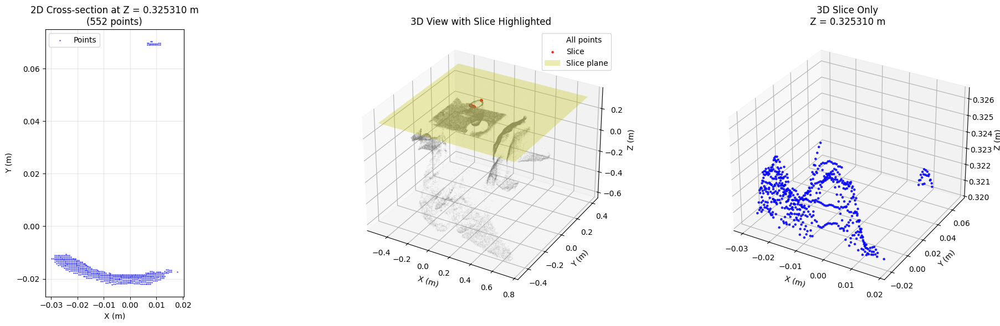

In [57]:
import trimesh
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from mpl_toolkits.mplot3d import Axes3D

depth1 = trimesh.load("/data/ephemeral/home/measure_volume_by_multiview/project/output/depth_pointcloud.glb")

# Z축 기준으로 뒤집기 (Z 좌표 반전)
flip_z = np.array([
    [1,  0,  0,  0],
    [0,  1,  0,  0],
    [0,  0, -1,  0],
    [0,  0,  0,  1]
])

# 모든 geometry에 적용
if isinstance(depth1, trimesh.Scene):
    for geom in depth1.geometry.values():
        geom.apply_transform(flip_z)
else:
    depth1.apply_transform(flip_z)

# 포인트 추출
def get_vertices_from_scene(scene):
    vertices_list = []
    if isinstance(scene, trimesh.Scene):
        for geom in scene.geometry.values():
            if hasattr(geom, 'vertices'):
                vertices_list.append(geom.vertices)
    else:
        if hasattr(scene, 'vertices'):
            vertices_list.append(scene.vertices)
    if len(vertices_list) == 0:
        return None
    return np.vstack(vertices_list)

points = get_vertices_from_scene(depth1)

if points is not None:
    # Z 범위 확인
    z_min = points[:, 2].min()
    z_max = points[:, 2].max()
    z_mid = (z_min + z_max) / 2
    
    print(f"Z 범위: {z_min:.6f} ~ {z_max:.6f} m")
    print(f"중간 높이: {z_mid:.6f} m")
    
    # 단면 두께
    thickness = 0.01
    
    # 중간 높이에서 단면 추출
    z_slice = 0.32531
    z_min_slice = z_slice - thickness / 2
    z_max_slice = z_slice + thickness / 2
    
    # 단면 포인트 필터링
    mask = (points[:, 2] >= z_min_slice) & (points[:, 2] <= z_max_slice)
    slice_points = points[mask]
    
    print(f"단면 포인트 수: {len(slice_points)}")
    
    # 2D 투영 (XY 평면)
    points_2d = slice_points[:, :2]
    
    # 시각화: 2D + 3D
    fig = plt.figure(figsize=(20, 6))
    
    # 1. 2D 단면 (XY 평면)
    ax1 = fig.add_subplot(131)
    ax1.scatter(points_2d[:, 0], points_2d[:, 1], s=1, alpha=0.5, c='blue', label='Points')
    ax1.set_xlabel('X (m)')
    ax1.set_ylabel('Y (m)')
    ax1.set_title(f'2D Cross-section at Z = {z_slice:.6f} m\n({len(slice_points)} points)')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    ax1.set_aspect('equal')
    
    # 2. 3D 전체 뷰 (단면 강조)
    ax2 = fig.add_subplot(132, projection='3d')
    # 전체 포인트 샘플링 (너무 많으면 렌더링 느림)
    if len(points) > 50000:
        sample_indices = np.random.choice(len(points), 50000, replace=False)
        points_sample = points[sample_indices]
    else:
        points_sample = points
    
    # 전체 포인트 (회색, 작게)
    ax2.scatter(points_sample[:, 0], points_sample[:, 1], points_sample[:, 2], 
                s=0.1, alpha=0.1, c='gray', label='All points')
    
    # 단면 포인트 (빨강, 크게)
    ax2.scatter(slice_points[:, 0], slice_points[:, 1], slice_points[:, 2], 
                s=5, alpha=0.8, c='red', label='Slice')
    
    # 단면 평면 표시
    x_range = [points[:, 0].min(), points[:, 0].max()]
    y_range = [points[:, 1].min(), points[:, 1].max()]
    xx, yy = np.meshgrid(
        np.linspace(x_range[0], x_range[1], 10),
        np.linspace(y_range[0], y_range[1], 10)
    )
    zz = np.full_like(xx, z_slice)
    ax2.plot_surface(xx, yy, zz, alpha=0.3, color='yellow', label='Slice plane')
    
    ax2.set_xlabel('X (m)')
    ax2.set_ylabel('Y (m)')
    ax2.set_zlabel('Z (m)')
    ax2.set_title('3D View with Slice Highlighted')
    ax2.legend()
    
    # 3. 3D 단면만 (확대)
    ax3 = fig.add_subplot(133, projection='3d')
    ax3.scatter(slice_points[:, 0], slice_points[:, 1], slice_points[:, 2], 
                s=5, alpha=0.8, c='blue')
    ax3.set_xlabel('X (m)')
    ax3.set_ylabel('Y (m)')
    ax3.set_zlabel('Z (m)')
    ax3.set_title(f'3D Slice Only\nZ = {z_slice:.6f} m')
    
    plt.tight_layout()
    plt.show()
else:
    print("포인트를 찾을 수 없습니다.")

# 3D 뷰어 (선택적)
# depth1.show()